In [1]:
import numpy as np 
import pandas as pd 
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz
from sklearn.preprocessing import OneHotEncoder
from IPython.display import Image  
from sklearn.tree import export_graphviz
from pydotplus import graph_from_dot_data
from sklearn.tree import plot_tree

In [2]:
training = pd.read_csv('training_set_values', index_col=0)
label = pd.read_csv('training_set_labels', index_col=0)
data = training.join(label.set_index('id'), on='id')
data.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [3]:
data.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'recorded_by',
       'scheme_management', 'scheme_name', 'permit', 'construction_year',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group', 'status_group'],
      dtype='object')

In [4]:
df = data[['id', 'amount_tsh', 'installer','basin', 'region', 'population', 'recorded_by',
           'scheme_management', 'scheme_name', 'permit', 'construction_year', 'extraction_type_class', 
           'management_group', 'payment_type','quality_group', 'quantity_group', 'source_class', 
           'waterpoint_type_group', 'status_group']]

In [5]:
df.head()

,id,amount_tsh,installer,basin,region,population,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type_class,management_group,payment_type,quality_group,quantity_group,source_class,waterpoint_type_group,status_group
0,69572,6000.0,Roman,Lake Nyasa,Iringa,109,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,user-group,annually,good,enough,groundwater,communal standpipe,functional
1,8776,0.0,GRUMETI,Lake Victoria,Mara,280,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,user-group,never pay,good,insufficient,surface,communal standpipe,functional
2,34310,25.0,World vision,Pangani,Manyara,250,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,user-group,per bucket,good,enough,surface,communal standpipe,functional
3,67743,0.0,UNICEF,Ruvuma / Southern Coast,Mtwara,58,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,user-group,never pay,good,dry,groundwater,communal standpipe,non functional
4,19728,0.0,Artisan,Lake Victoria,Kagera,0,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,other,never pay,good,seasonal,surface,communal standpipe,functional


In [6]:
df.basin.value_counts()

Lake Victoria              10248
Pangani                     8940
Rufiji                      7976
Internal                    7785
Lake Tanganyika             6432
Wami / Ruvu                 5987
Lake Nyasa                  5085
Ruvuma / Southern Coast     4493
Lake Rukwa                  2454
Name: basin, dtype: int64

In [7]:
df.region.value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

In [8]:
df.amount_tsh.value_counts()

0.0         41639
500.0        3102
50.0         2472
1000.0       1488
20.0         1463
            ...  
8500.0          1
6300.0          1
220.0           1
138000.0        1
12.0            1
Name: amount_tsh, Length: 98, dtype: int64

In [9]:
df.drop('amount_tsh', axis=1, inplace=True)

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/pandas/core/frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [10]:
df.installer.value_counts()

DWE                         17402
Government                   1825
RWE                          1206
Commu                        1060
DANIDA                       1050
                            ...  
RDWS                            1
Meru Concrete                   1
Word bank                       1
NGO'S                           1
UMOJA DRILLING CONTRUCTO        1
Name: installer, Length: 2145, dtype: int64

In [11]:
df.recorded_by.value_counts()

GeoData Consultants Ltd    59400
Name: recorded_by, dtype: int64

In [12]:
df.drop('recorded_by', axis=1, inplace=True)

In [13]:
df.head

<bound method NDFrame.head of           id     installer                    basin       region  population  \
0      69572         Roman               Lake Nyasa       Iringa         109   
1       8776       GRUMETI            Lake Victoria         Mara         280   
2      34310  World vision                  Pangani      Manyara         250   
3      67743        UNICEF  Ruvuma / Southern Coast       Mtwara          58   
4      19728       Artisan            Lake Victoria       Kagera           0   
...      ...           ...                      ...          ...         ...   
59395  60739           CES                  Pangani  Kilimanjaro         125   
59396  27263          Cefa                   Rufiji       Iringa          56   
59397  37057           NaN                   Rufiji        Mbeya           0   
59398  31282          Musa                   Rufiji       Dodoma           0   
59399  26348         World              Wami / Ruvu     Morogoro         150   

      sch

In [14]:
df.scheme_management.value_counts()

VWC                 36793
WUG                  5206
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 766
SWC                    97
Trust                  72
None                    1
Name: scheme_management, dtype: int64

In [15]:
df.scheme_name.value_counts()

K                             682
None                          644
Borehole                      546
Chalinze wate                 405
M                             400
                             ... 
PIDP                            1
BL mese Tank                    1
Magoto piped  water suplly      1
Mugoma spring source            1
BL Dispensary                   1
Name: scheme_name, Length: 2696, dtype: int64

In [16]:
df.extraction_type_class.value_counts()

gravity         26780
handpump        16456
other            6430
submersible      6179
motorpump        2987
rope pump         451
wind-powered      117
Name: extraction_type_class, dtype: int64

In [17]:
df.management_group.value_counts()

user-group    52490
commercial     3638
parastatal     1768
other           943
unknown         561
Name: management_group, dtype: int64

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 17 columns):
id                       59400 non-null int64
installer                55745 non-null object
basin                    59400 non-null object
region                   59400 non-null object
population               59400 non-null int64
scheme_management        55523 non-null object
scheme_name              31234 non-null object
permit                   56344 non-null object
construction_year        59400 non-null int64
extraction_type_class    59400 non-null object
management_group         59400 non-null object
payment_type             59400 non-null object
quality_group            59400 non-null object
quantity_group           59400 non-null object
source_class             59400 non-null object
waterpoint_type_group    59400 non-null object
status_group             59400 non-null object
dtypes: int64(3), object(14)
memory usage: 8.2+ MB


In [19]:
X = df.loc[:, ['basin', 'region', 'population','construction_year', 'extraction_type_class', 
               'quality_group','source_class', 'waterpoint_type_group']]
y = df.loc[:, 'status_group']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [20]:
ohe = OneHotEncoder()

ohe.fit(X_train)
X_train_ohe = ohe.transform(X_train).toarray()

# Creating this DataFrame is not necessary its only to show the result of the ohe
ohe_df = pd.DataFrame(X_train_ohe, columns=ohe.get_feature_names(X_train.columns))

ohe_df.head()

,basin_Internal,basin_Lake Nyasa,basin_Lake Rukwa,basin_Lake Tanganyika,basin_Lake Victoria,basin_Pangani,basin_Rufiji,basin_Ruvuma / Southern Coast,basin_Wami / Ruvu,region_Arusha,...,quality_group_unknown,source_class_groundwater,source_class_surface,source_class_unknown,waterpoint_type_group_cattle trough,waterpoint_type_group_communal standpipe,waterpoint_type_group_dam,waterpoint_type_group_hand pump,waterpoint_type_group_improved spring,waterpoint_type_group_other
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [21]:
clf = DecisionTreeClassifier(criterion='entropy')

clf.fit(X_train_ohe, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [22]:
# Create DOT data
dot_data = export_graphviz(clf, out_file=None, 
                           feature_names=ohe_df.columns,  
                           class_names=np.unique(y).astype('str'), 
                           filled=True, rounded=True, special_characters=True)

# Draw graph
graph = graph_from_dot_data(dot_data)  

# Show graph
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.188649 to fit



In [23]:
clf2 = DecisionTreeClassifier(criterion='entropy', max_depth=4)

clf2.fit(X_train_ohe, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

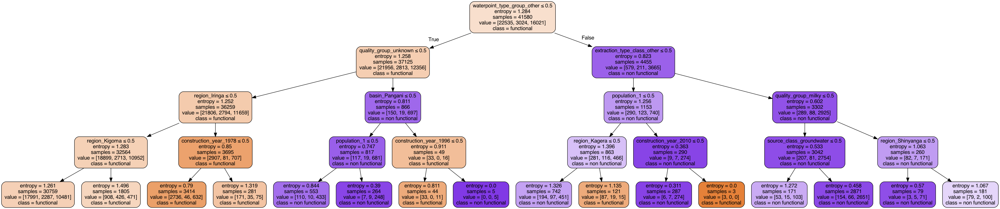

In [24]:
dot_data = export_graphviz(clf2, out_file=None, 
                           feature_names=ohe_df.columns,  
                           class_names=np.unique(y).astype('str'), 
                           filled=True, rounded=True, special_characters=True)

graph = graph_from_dot_data(dot_data)  

Image(graph.create_png())

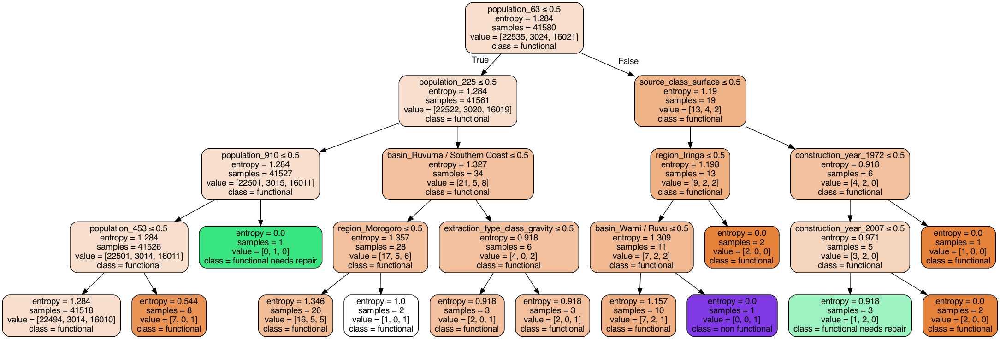

In [27]:
clf3 = DecisionTreeClassifier(criterion='entropy', max_depth=4, max_features=4)
clf3.fit(X_train_ohe, y_train)
dot_data = export_graphviz(clf3, out_file=None, 
                           feature_names=ohe_df.columns,  
                           class_names=np.unique(y).astype('str'), 
                           filled=True, rounded=True, special_characters=True)

graph = graph_from_dot_data(dot_data)  

Image(graph.create_png())